## Initialize

In [54]:
import meep as mp
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image

In the following, we can input the parameters as the tutorial.

In [20]:
resolution = 20   # pixels/um

eps = 13          # dielectric constant of waveguide
w = 1.2           # width of waveguide
r = 0.36          # radius of holes
d = 1.4           # defect spacing (ordinary spacing = 1)

sy = 6      # size of cell in y direction (perpendicular to wvg.)
pad = 2           # padding between last hole and PML edge
dpml = 1          # PML thickness

fcen = 0.25   # pulse center frequency
df = 0.2  

pml_layers = [mp.PML(1.0)]

Next, we do the initial run for the transmission without any hole

In [31]:
N = 0
sx = 2*(pad+dpml+N)+d-1
cell = mp.Vector3(sx,sy,0)
geometry = [mp.Block(size=mp.Vector3(mp.inf,w,mp.inf), material=mp.Medium(epsilon=eps))]
src = [mp.Source(mp.GaussianSource(fcen, fwidth=df),
                 component=mp.Ey,
                 center=mp.Vector3(-0.5*sx+dpml),
                 size=mp.Vector3(0,w))]
sym = [mp.Mirror(mp.Y, phase=-1)]
sim = mp.Simulation(cell_size=cell,
                    geometry=geometry,
                    boundary_layers=pml_layers,
                    sources=src,
                    symmetries=sym,
                    resolution=resolution)
freg = mp.FluxRegion(center=mp.Vector3(0.5*sx-dpml-0.5),
                         size=mp.Vector3(0,2*w))
nfreq = 500 # number of frequencies at which to compute flux

# transmitted flux
trans = sim.add_flux(fcen, df, nfreq, freg)

sim.run(mp.at_beginning(mp.output_epsilon),
        until_after_sources=mp.stop_when_fields_decayed(50, mp.Ey, mp.Vector3(0.5*sx-dpml-0.5), 1e-3))
nohole_flux = mp.get_fluxes(trans)

-----------
Initializing structure...
Halving computational cell along direction y
time for choose_chunkdivision = 0.00225687 s
Working in 2D dimensions.
Computational cell is 6.4 x 6 x 0 with resolution 20
     block, center = (0,0,0)
          size (1e+20,1.2,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13,13,13)
time for set_epsilon = 0.044435 s
-----------
creating output file "./eps-000000.00.h5"...
field decay(t = 50.025000000000006): 0.024304124551377634 / 0.024304124551377634 = 1.0
field decay(t = 100.05000000000001): 0.0002947877364436887 / 0.024304124551377634 = 0.012129123837417925
field decay(t = 150.07500000000002): 8.914669651555428e-14 / 0.024304124551377634 = 3.667965753183287e-12
run 0 finished at t = 150.07500000000002 (6003 timesteps)


## Transmission

In [63]:
show_T = True  # a switch to determine if we will show transmission graph in the following
T_graph_file = 'wvg_cavity_n5.png' # the name of the file to save transmission graph
record_animate = True  # a switch to determine if we will record the animation during the process

In [62]:
N = 3        # number of holes on either side of defect
sx = 2*(pad+dpml+N)+d-1
cell = mp.Vector3(sx,sy,0)
blk = mp.Block(size=mp.Vector3(mp.inf,w,mp.inf), material=mp.Medium(epsilon=eps))
geometry = [blk]

for i in range(N):
        geometry.append(mp.Cylinder(r, center=mp.Vector3(d/2+i)))
        geometry.append(mp.Cylinder(r, center=mp.Vector3(-(d/2+i))))

In [64]:
src = [mp.Source(mp.GaussianSource(fcen, fwidth=df),
                 component=mp.Ey,
                 center=mp.Vector3(-0.5*sx+dpml),
                 size=mp.Vector3(0,w))]
sym = [mp.Mirror(mp.Y, phase=-1)]
sim = mp.Simulation(cell_size=cell,
                    geometry=geometry,
                    boundary_layers=pml_layers,
                    sources=src,
                    symmetries=sym,
                    resolution=resolution)

In [65]:
freg = mp.FluxRegion(center=mp.Vector3(0.5*sx-dpml-0.5),
                         size=mp.Vector3(0,2*w))
nfreq = 500 # number of frequencies at which to compute flux

# transmitted flux
trans = sim.add_flux(fcen, df, nfreq, freg)

In [66]:
sim.run(mp.at_beginning(mp.output_epsilon),
        until_after_sources=mp.stop_when_fields_decayed(50, mp.Ey, mp.Vector3(0.5*sx-dpml-0.5), 1e-3))

-----------
Initializing structure...
Halving computational cell along direction y
time for choose_chunkdivision = 0.00228 s
Working in 2D dimensions.
Computational cell is 12.4 x 6 x 0 with resolution 20
     block, center = (0,0,0)
          size (1e+20,1.2,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13,13,13)
     cylinder, center = (0.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (-0.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (1.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (-1.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (2.7,0,0)
          radius 0.36, h

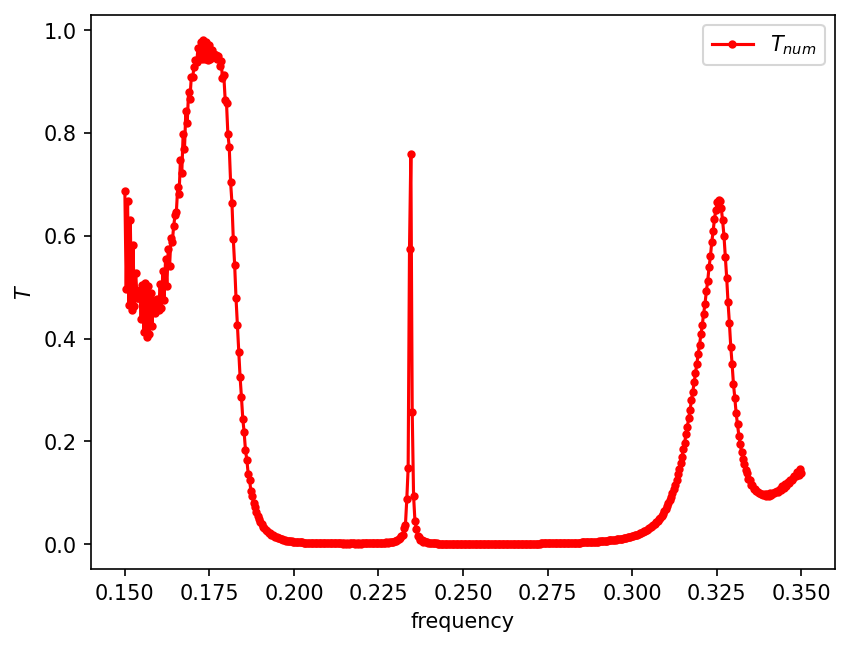

-----------
Initializing structure...
Halving computational cell along direction y
time for choose_chunkdivision = 0.00115299 s
Working in 2D dimensions.
Computational cell is 12.4 x 6 x 0 with resolution 20
     block, center = (0,0,0)
          size (1e+20,1.2,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13,13,13)
     cylinder, center = (0.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (-0.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (1.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (-1.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (2.7,0,0)
          radius 0.36

In [67]:
tran_flux = mp.get_fluxes(trans)
if show_T == True:
    wl = []
    Ts = []
    flux_freqs = mp.get_flux_freqs(trans)
    for i in range(nfreq):
        wl = np.append(wl, flux_freqs[i])
        Ts = np.append(Ts,tran_flux[i]/nohole_flux[i])   
    plt.figure(dpi=150)
    plt.plot(wl,Ts,'r.-',label='$T_{num}$')
    plt.xlabel(r'frequency')
    plt.ylabel('$T$')
    plt.legend(loc="upper right")
    plt.savefig(T_graph_file)
    plt.show()
if record_animate == True:
    sim.reset_meep()
    animate = mp.Animate2D(sim,
                       fields=mp.Hz, realtime=False, normalize=True,
                       field_parameters={'alpha':0.8, 'cmap':'seismic','interpolation':'none'})
    plt.close()
    sim.run(mp.at_beginning(mp.output_epsilon), mp.at_every(0.5,animate), until=100)
    animate.to_gif(10, 'wvg_cavity.gif')

The effective dielectric constant $\epsilon_{\alpha}$ is confined in:
$$(\alpha_1\epsilon_1^{-1} + \alpha_2\epsilon_2^{-1})^{-1} \leq \epsilon_{\alpha} \leq \alpha_1\epsilon_1 + \alpha_2\epsilon_2 $$
For this case, we have $\alpha_1=0.36^2\pi\approx 0.407$ for air and $\alpha_2 \approx 0.593$ for the material. So, we have:
$$2.209\leq\epsilon_{\alpha}\leq 8.116$$
If we assume the wavelength of the resonate mode is roughly $2d=2.8$, then the frequency is:
$$f=\frac{1}{\sqrt{\epsilon_\alpha}\lambda}=\frac{1}{2.8\sqrt{\epsilon_\alpha}}\,,$$
so, the frequency of the resonate mode is between:
$$0.125\leq f \leq 0.24$$

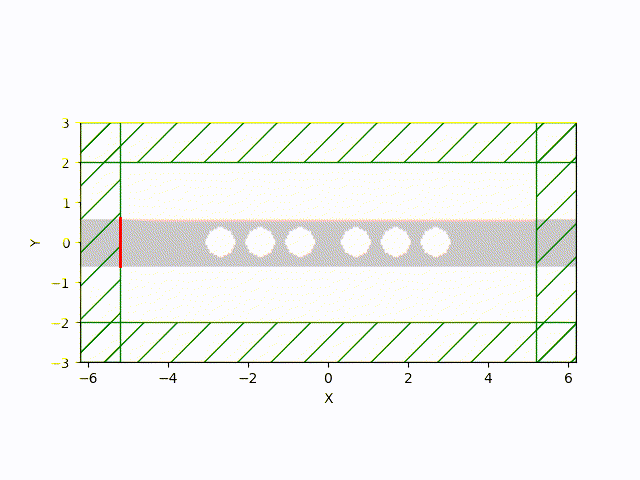

In [68]:
Image("wvg_cavity.gif")

## Resonant Modes

We initial Q_list as an empty list.

In [163]:
Q_list = []

If we want to get Q values for several different N setups, we should turn on add_qlist and run the following three cells several times. Each time, we add the result of Q for the mode with $f\approx 0.2345$ into Q_list. The frequency range of the source should be set appropriately.

On the other hand, if we want to look at particular mode, we can turn on r_animate and set the frequency range to that mode.

In [231]:
r_animate = True  # a switch to determine if we should record the animation after the source turn off
r_animate_file = 'resonant_n16_leaky.gif'  # the name of the file of the recorded animation
add_qlist = False  # a switch to determine if we should add Q value into Q_list

N = 16        # number of holes on either side of defect
sx = 2*(pad+dpml+N)+d-1
sy = 12

fcen = 0.3251435008770197
df = 0.01

cell = mp.Vector3(sx,sy,0)
blk = mp.Block(size=mp.Vector3(mp.inf,w,mp.inf), material=mp.Medium(epsilon=eps))
geometry = [blk]

for i in range(N):
        geometry.append(mp.Cylinder(r, center=mp.Vector3(d/2+i)))
        geometry.append(mp.Cylinder(r, center=mp.Vector3(-(d/2+i))))

In [232]:
src = [mp.Source(mp.GaussianSource(fcen, fwidth=df), 
                     component=mp.Hz, 
                     center=mp.Vector3(0))]
sym = [mp.Mirror(mp.Y, phase=-1), mp.Mirror(mp.X, phase=-1)]
sim = mp.Simulation(cell_size=cell,
                    geometry=geometry,
                    boundary_layers=pml_layers,
                    sources=src,
                    symmetries=sym,
                    resolution=resolution)

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00355101 s
Working in 2D dimensions.
Computational cell is 38.4 x 12 x 0 with resolution 20
     block, center = (0,0,0)
          size (1e+20,1.2,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13,13,13)
     cylinder, center = (0.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (-0.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (1.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cylinder, center = (-1.7,0,0)
          radius 0.36, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (1,1,1)
     cyli

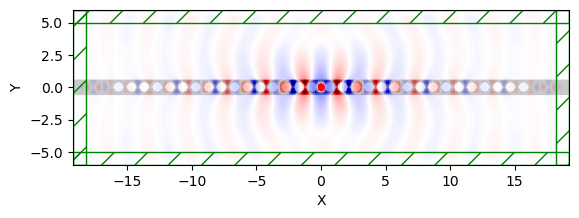

In [233]:
h = mp.Harminv(mp.Hz, mp.Vector3(), fcen, df)
sim.run(mp.at_beginning(mp.output_epsilon),
        mp.after_sources(h),
        until_after_sources=500)
if r_animate:
    animate = mp.Animate2D(sim,
                           fields=mp.Hz,
                           realtime=False, 
                           normalize=True,
                           field_parameters={'alpha':0.8, 'cmap':'seismic','interpolation':'none'})
    sim.run(mp.at_every(1/fcen/20,animate),until=10)
    animate.to_gif(8, r_animate_file)
if add_qlist == True:
    for i in range(len(h.modes)):
        if h.modes[i][0] < 0.235 and h.modes[i][0] > 0.234:
            Q_list.append([N, h.modes[i][2]])

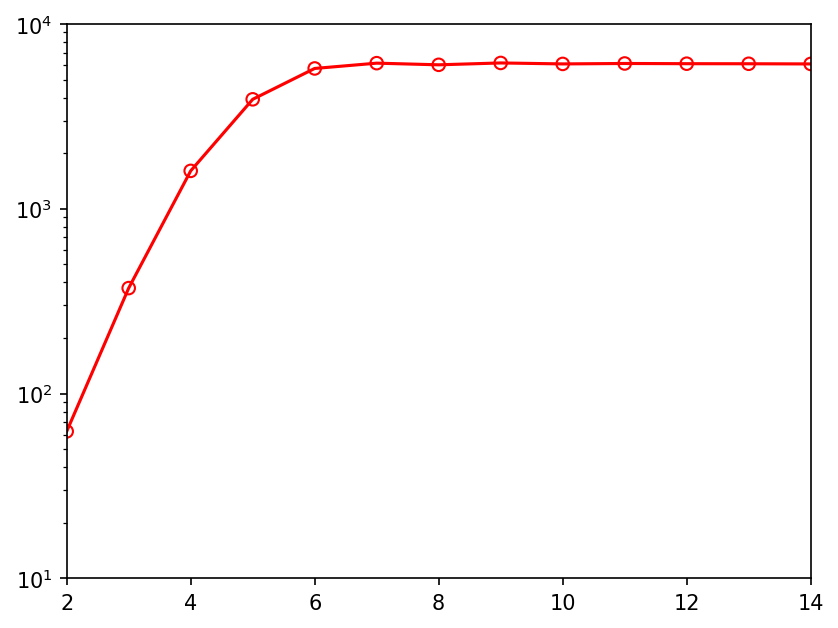

In [215]:
Q_list_np = np.array(Q_list)
plt.figure(dpi=150)
plt.scatter(Q_list_np.T[0], Q_list_np.T[1], facecolors='none', edgecolors='r')
plt.plot(Q_list_np.T[0], Q_list_np.T[1], 'r-')
plt.yscale('log')
plt.ylim([10, 10**4])
plt.xlim([2, 14])
plt.show()

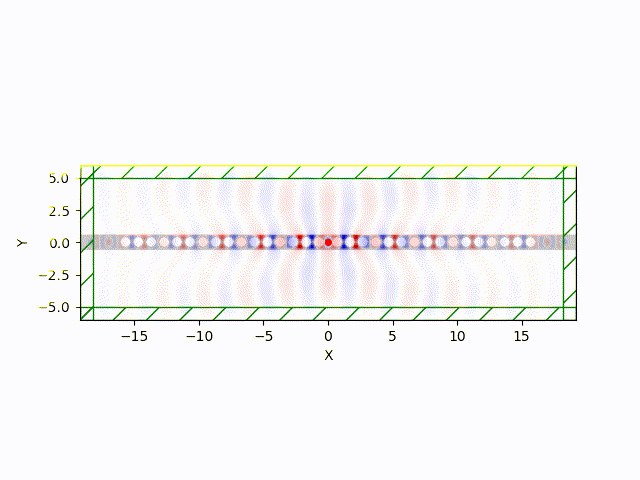

In [234]:
Image(r_animate_file)

The following is the table of data generated by harminv for several N's

The Table of the harminv data (N=3 ~ 16)
--------------------------------------

| N | freq. | imag_freq. | Q | amp_abs | amp. | error |  
|---|-------|------------|---|---------|------|-------|  
|3 | 0.23445415346006226　| -0.00031478123673809406 | 372.4080823393137 | 5.812143033469647 | -3.7631074859206017-4.429450156725785i | 4.306867964117698e-09+0.0i |
|4 | 0.23453222951306762 | -7.30923062715145e-05 | 1604.356473866453 | 6.0100109438386475 | -3.965258364464881-4.516299109680581i | 2.5761763713184823e-09+0.0i |
|5 | 0.2345387938421191 | -2.9970106008375417e-05 | 3912.8789497203497 | 6.033594329111767 | -3.9885430152465604+4.527227092141231i | 2.4556309239165568e-09+0.0i |
|6 |0.23454147743770024 | -2.0401854012174085e-05 | 5748.043224349755 | 6.042373544573051 | -3.995722012874045+4.532602304194588i | 2.9498514075486027e-09+0.0i |
|7 |0.23454248284598067 | -1.9098939351523682e-05 | 6140.196545188496 | 6.044435683811193 | -3.9972394452123923+4.5340136251855485i | 3.802676262098697e-09+0.0i |
|8 |0.23454251749223734 | -1.9496547240867192e-05 | 6014.975744028332 | 6.04519011754251 | -3.9989028663476476-4.533552627107156i | 3.189278195093771e-09+0.0i |
|9 |0.23454236987987423 | -1.9049479758053688e-05 | 6156.135833072161 | 6.044216672669596 | -3.9977286268134216-4.533290307550753i | 1.346551176668701e-09+0.0i |
|10 |0.2345423761255255 | -1.9280329864243862e-05 | 6082.426436087426 | 6.04472282742359 | -3.9985388641729993-4.533250601066959i | 2.1532565779319237e-09+0.0i |
|11 |0.23454245923345798 | -1.9174785609692344e-05 | 6115.908255967749 | 6.045275839181097 | -3.9984757383723672-4.534043641324406i | 2.7525875866729585e-09+0.0i |
|12 |0.23454232067567615 | -1.9226036396163873e-05 | 6099.601494629279 | 6.044410882919895 | -3.998470677645111+4.532894788275226i | 2.188271238797702e-09+0.0i |
|16 | 0.23454234846449898 | -1.9204887759827115e-05 | 6106.319167225645 | 6.044727379668979 | -3.998412175383702-4.533368413251141i | 1.475355101316072e-09+0.0i |


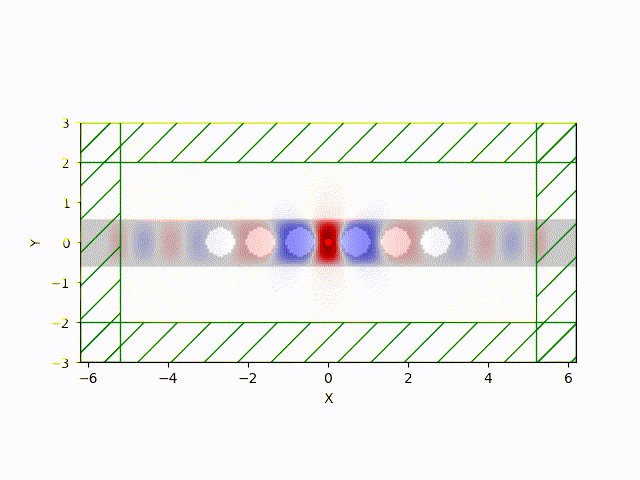

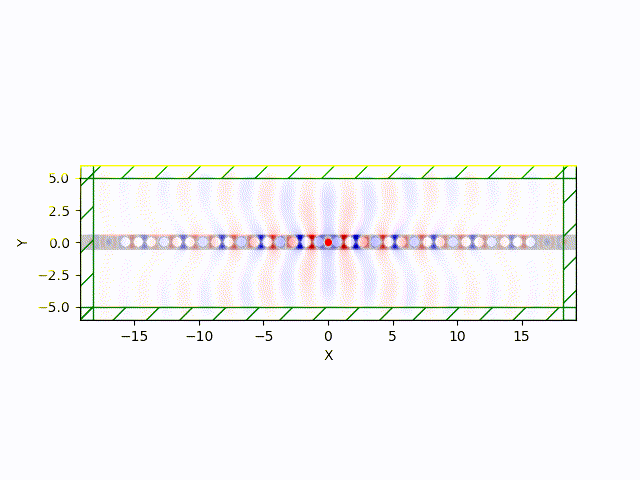